In [1]:
import numpy as np
import matplotlib.pyplot as plt
import uncertainties.unumpy as unp
import uncertainties as uncrt
from uncertainties import ufloat
from uncertainties.unumpy import uarray
from scipy.optimize import curve_fit
from scipy.signal import find_peaks
import scipy.constants as constants
from header import *
from matplotlib.colors import hsv_to_rgb
import matplotlib.cm as cm

In [2]:
N_POINTS=100000
N_RUNS=100

#the location of the data
#directory="Data\data_6_12\\"
#directory="Data\data_broad\\"
directory="Data\Zeeman Data\data_z5\\"

<>:7: SyntaxWarning: invalid escape sequence '\Z'
<>:7: SyntaxWarning: invalid escape sequence '\Z'
C:\Users\Student\AppData\Local\Temp\ipykernel_2796\3478636575.py:7: SyntaxWarning: invalid escape sequence '\Z'
  directory="Data\Zeeman Data\data_z5\\"


In [3]:
#Load in the data to an array where the first index is the run and the second(last) index is the sample
data=np.zeros((N_RUNS,N_POINTS))
for i in range(N_RUNS):
    data[i]=np.fromfile(directory+"ch1_{}.bin".format(i),dtype='int8')

calibration=np.zeros((N_RUNS,N_POINTS))
for i in range(N_RUNS):
    calibration[i]=np.fromfile(directory+"ch2_{}.bin".format(i),dtype='int8')

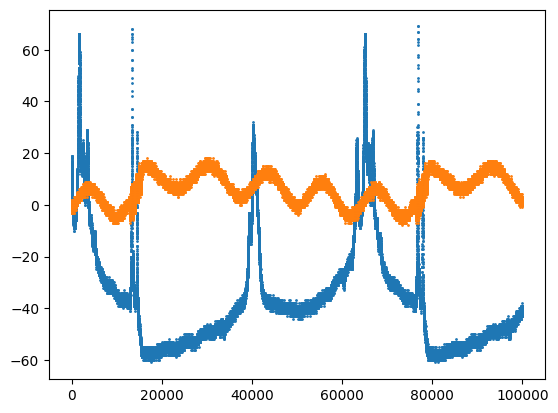

In [4]:
plt.scatter(np.arange(0,N_POINTS),data[0],marker='o',s=1)
plt.scatter(np.arange(0,N_POINTS),calibration[0],marker='o',s=1)
plt.show()

In [5]:
C_GROUP_SIZE=100
C_N_GROUPS=N_POINTS//C_GROUP_SIZE
D_GROUP_SIZE=10
D_N_GROUPS=N_POINTS//D_GROUP_SIZE

grouped_data=uarray(np.zeros((N_RUNS,D_N_GROUPS)),np.zeros((N_RUNS,D_N_GROUPS)))
grouped_calibration=uarray(np.zeros((N_RUNS,C_N_GROUPS)),np.zeros((N_RUNS,C_N_GROUPS)))

for run in range(N_RUNS):
    for group in range(D_N_GROUPS):
        grouped_data[run,group]=ufloat_from_sample(data[run,group*D_GROUP_SIZE:(group+1)*D_GROUP_SIZE])
    for group in range(C_N_GROUPS):
        grouped_calibration[run,group]=ufloat_from_sample(calibration[run,group*C_GROUP_SIZE:(group+1)*C_GROUP_SIZE])

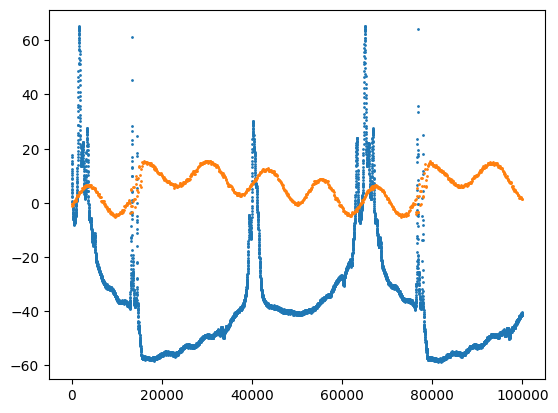

In [6]:
plt.scatter(np.arange(0,N_POINTS,D_GROUP_SIZE),unp.nominal_values(grouped_data[0]),marker='o',s=1)
plt.scatter(np.arange(0,N_POINTS,C_GROUP_SIZE),unp.nominal_values(grouped_calibration[0]),marker='o',s=1)
plt.show()

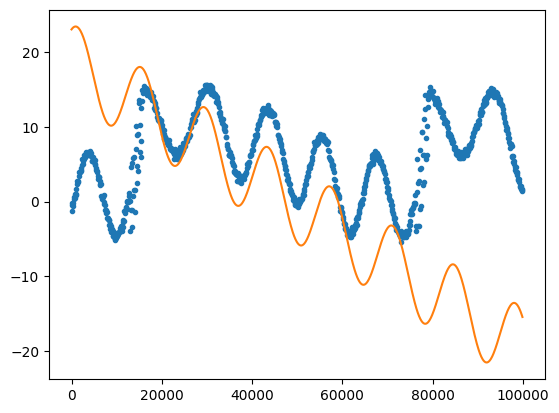

In [7]:

def fit(t,A,phi_0,phi_1,phi_2,C0,C1):
    return A*(np.sin(phi_2*t**2+phi_1*t+phi_0))+(C1*t+C0)

p0=[5.2,1.006,0.00044,1.3*10**(-10),18.6,-0.00038]

plt.scatter(np.arange(0,N_POINTS,C_GROUP_SIZE),unp.nominal_values(grouped_calibration[0]),marker='.')
plt.plot(np.arange(0,N_POINTS,C_GROUP_SIZE),fit(np.arange(0,N_POINTS,C_GROUP_SIZE),*p0),color='C1')
plt.show()


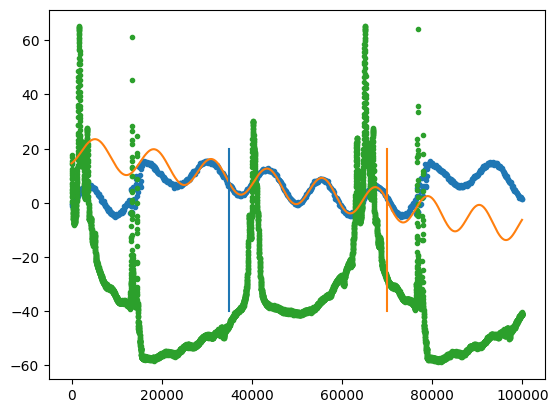

In [8]:
C_paramiters=uarray(np.zeros((N_RUNS, len(p0))),np.zeros((N_RUNS, len(p0))))

i=35000
f=70000

for run in range(N_RUNS):
    popt,pcov=curve_fit(
        f=fit,
        xdata=np.arange(i,f,C_GROUP_SIZE),
        ydata=unp.nominal_values(grouped_calibration[run,i//C_GROUP_SIZE:f//C_GROUP_SIZE]),
        p0=p0,
        #sigma=unp.std_devs(grouped_calibration[run,i:f]),
        #absolute_sigma=True~
    )
    C_paramiters[run]=uncrt.correlated_values(popt,pcov)


plt.scatter(np.arange(0,N_POINTS,C_GROUP_SIZE),unp.nominal_values(grouped_calibration[0]),marker='.')
plt.plot(np.arange(0,N_POINTS,C_GROUP_SIZE),fit(np.arange(0,N_POINTS,C_GROUP_SIZE),*unp.nominal_values(C_paramiters[0])),color='C1')
plt.scatter(np.arange(0,N_POINTS,D_GROUP_SIZE),unp.nominal_values(grouped_data[0]),marker='.', color='C2')
plt.plot([i,i],[-40,20])
plt.plot([f,f],[-40,20])
plt.show()

In [9]:

L1=ufloat(0.075,0.003)
L2=ufloat(0.37,0.002)

def d(t,i):
    return unp.nominal_values(constants.c*(C_paramiters[i,1]+C_paramiters[i,2]*t+C_paramiters[i,3]*t**2)/(4*np.pi*(L1-L2)))

p1=np.mean(unp.nominal_values(C_paramiters[:,1]))
p2=np.mean(unp.nominal_values(C_paramiters[:,2]))
p3=np.mean(unp.nominal_values(C_paramiters[:,3]))

def md(t):
    return unp.nominal_values(constants.c*(p2*t+p3*t**2)/(4*np.pi*(L1-L2)))*10**(-9)

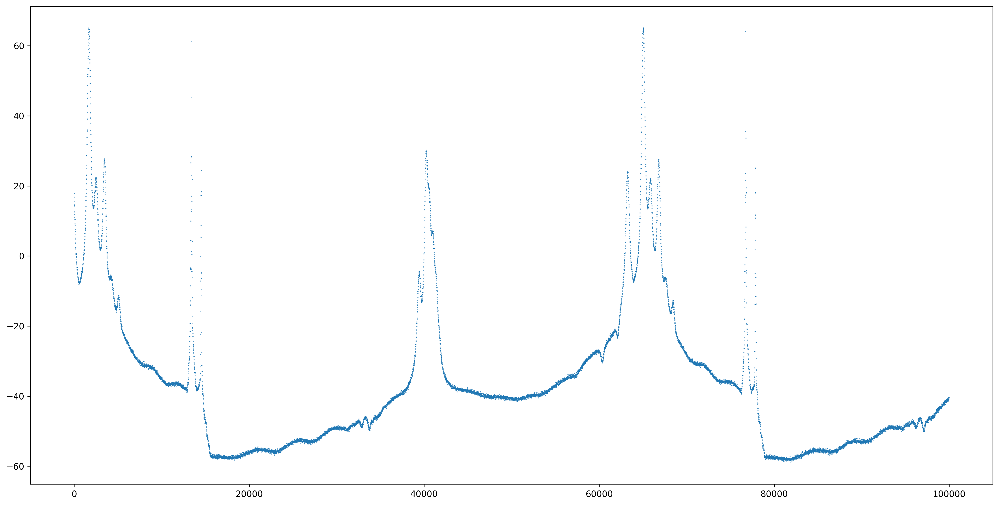

In [10]:
plt.figure(figsize=(20,10),dpi=300)

for i in range(1):
    plt.scatter(np.arange(0,N_POINTS,D_GROUP_SIZE),unp.nominal_values(grouped_data[i]),s=0.1)
plt.show()

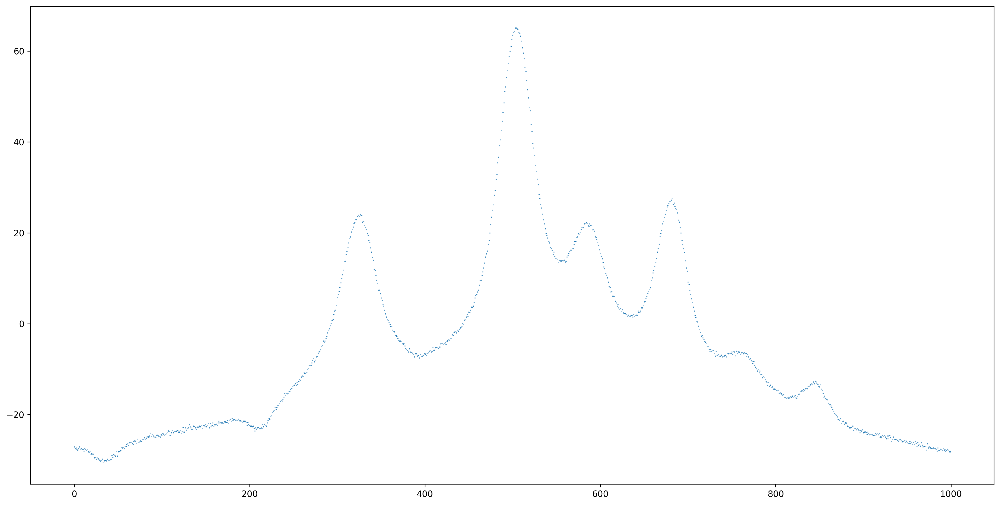

In [11]:
spec=unp.nominal_values(grouped_data[0,6000:7000])

#peaks,_=find_peaks(spec,prominence=1.1)

plt.figure(figsize=(20,10),dpi=300)
plt.scatter(np.arange(0,1000),spec,s=0.1)
#plt.scatter(peaks,spec[peaks])
plt.show()


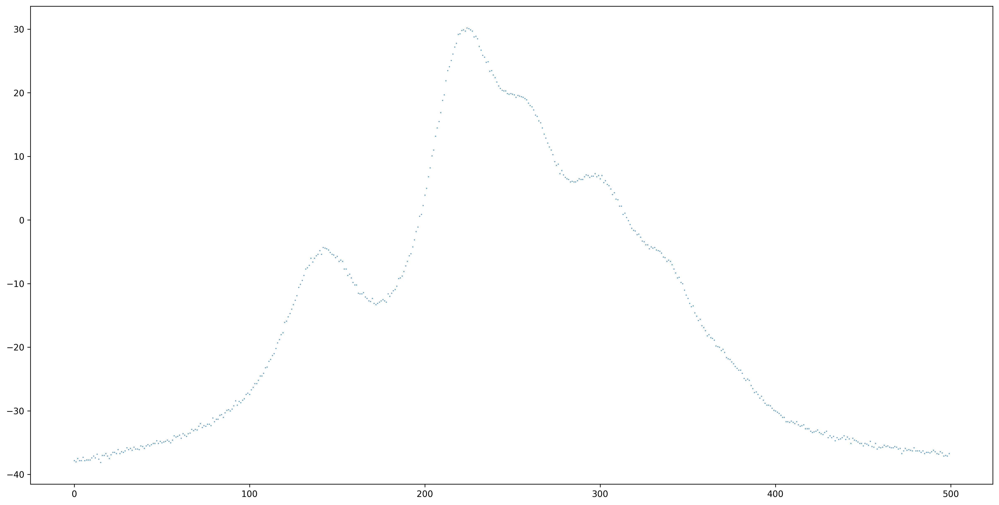

In [12]:
spec=unp.nominal_values(grouped_data[0,3800:4300])

peaks,_=find_peaks(spec,prominence=1.1)

plt.figure(figsize=(20,10),dpi=300)
plt.scatter(np.arange(0,500),spec,s=0.1)
#plt.scatter(peaks,spec[peaks])
plt.show()

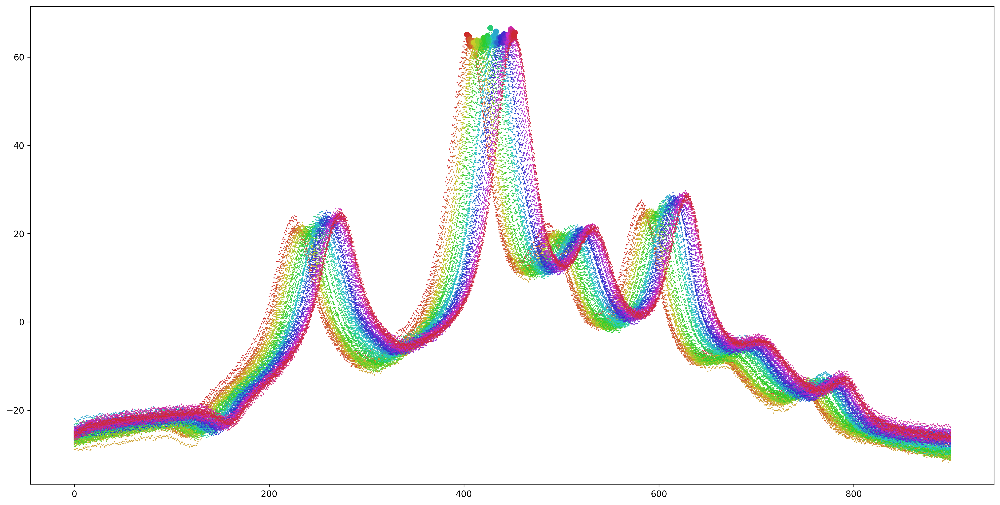

In [13]:
offset=np.zeros(100)

plt.figure(figsize=(20,10),dpi=300)
for i in range(100):
    spec=unp.nominal_values(grouped_data[i,6100:7000])
    col=hsv_to_rgb((i/100,0.8,0.8))
    plt.scatter(np.arange(0,900),spec,s=0.2,color=col)
    peaks,properties=find_peaks(spec,prominence=1)
    peak_order=np.argsort(properties["prominences"])
    plt.scatter(peaks[peak_order[-1]],spec[peaks[peak_order[-1]]],color=col)
    offset[i]=peaks[peak_order[-1]]
plt.show()

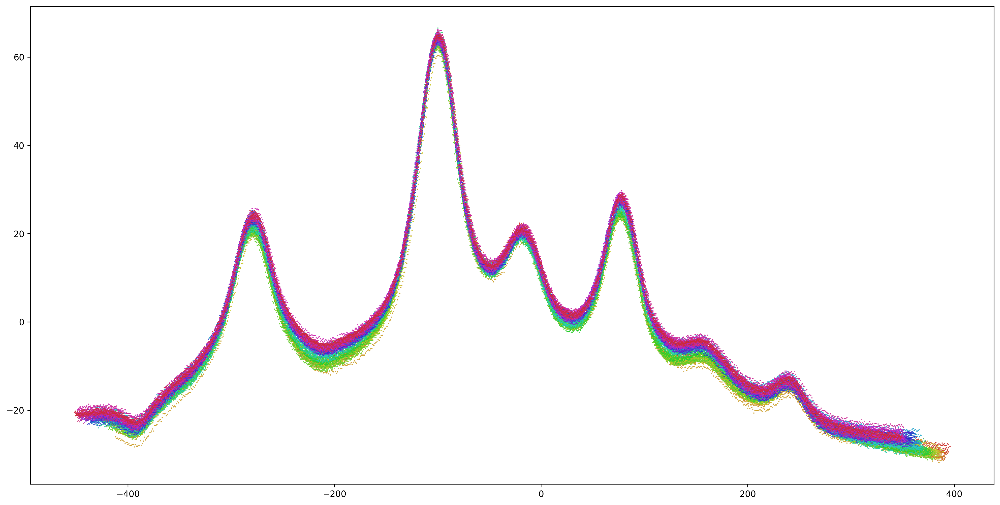

In [14]:
plt.figure(figsize=(20,10),dpi=300)
for i in range(100):
    spec=unp.nominal_values(grouped_data[i,6200:7000])
    col=hsv_to_rgb((i/100,0.8,0.8))
    plt.scatter(np.arange(0,800)-offset[i],spec,s=0.2,color=col)

plt.show()

In [15]:
ts=[]
vs=[]
for i in range(N_RUNS):
    vs+=list(unp.nominal_values(data[i]))
    ts+=list(np.arange(0,N_POINTS)-offset[i]*D_GROUP_SIZE)

ts=np.array(ts)
vs=np.array(vs)

In [16]:
order=np.argsort(ts)

ts=ts[order]
vs=vs[order]

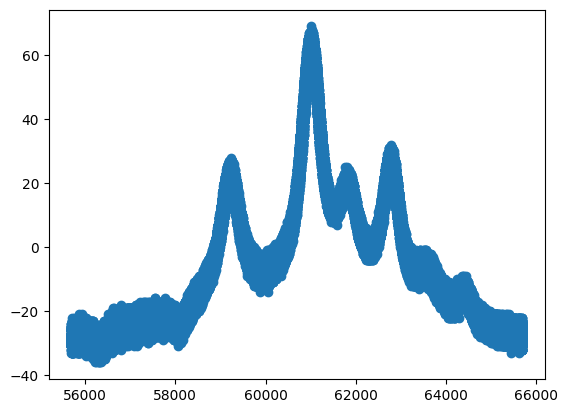

In [17]:
plt.scatter(ts[6000000:7000000],vs[6000000:7000000])
ts=ts[6000000:7000000]
vs=vs[6000000:7000000]


In [18]:


bin_width=np.abs((ts[0]-ts[-1])/1000)
start=ts[0]

gts=[[]]
gvs=[[]]

for i,t in enumerate(ts):
    if t<start+bin_width:
        gts[-1].append(t)
        gvs[-1].append(vs[i])
    else:
        start+=bin_width
        gts.append([t])
        gvs.append([vs[i]])

gts=np.array(gts[1:-1])
gvs=np.array(gvs[1:-1])

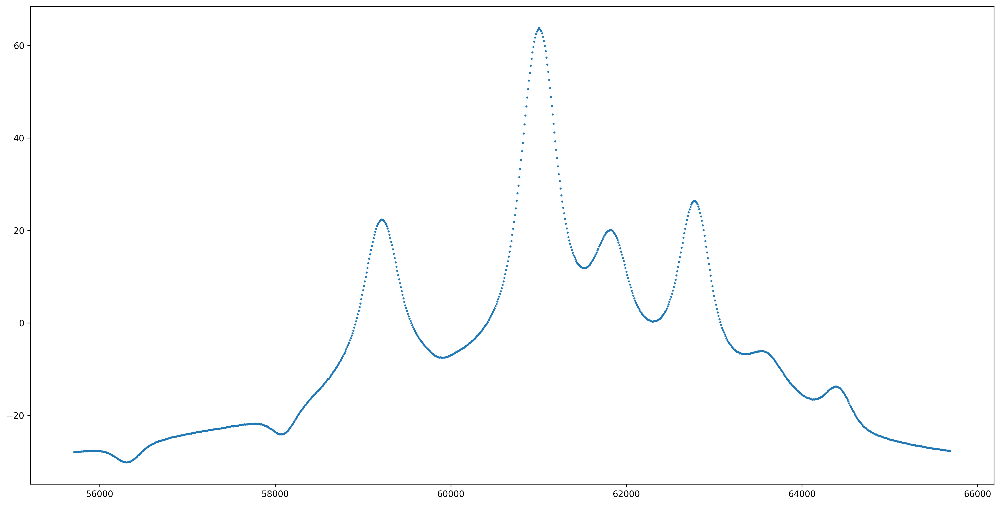

In [19]:
plt.figure(figsize=(20,10),dpi=300)
plt.scatter(np.mean(gts,axis=1),np.mean(gvs,axis=1),s=2)


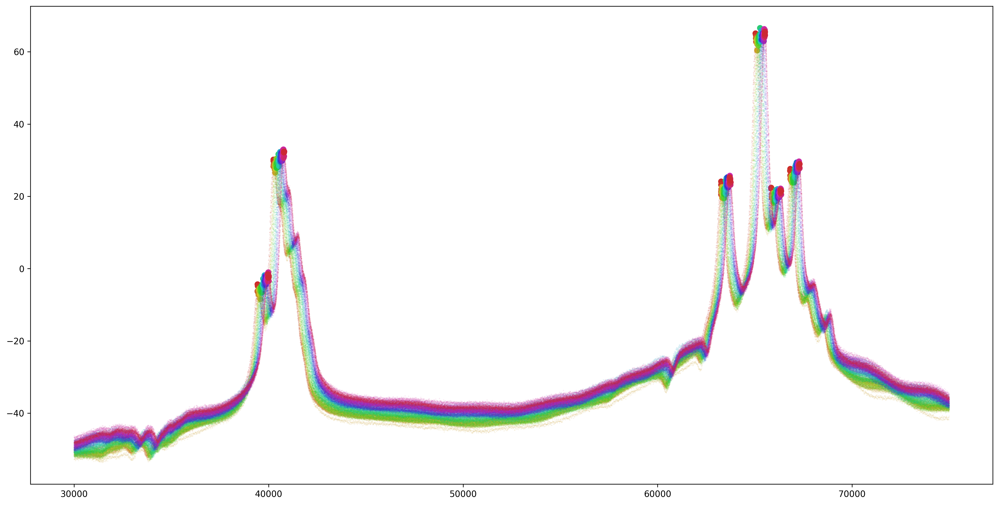

In [20]:
offset=[]

plt.figure(figsize=(20,10),dpi=300)
for i in range(100):
    spec=unp.nominal_values(grouped_data[i,3000:7500])
    col=hsv_to_rgb((i/100,0.8,0.8))
    plt.scatter(np.arange(3000,7500)*D_GROUP_SIZE,spec,s=0.2,color=col,alpha=0.1)
    peaks,properties=find_peaks(spec,prominence=1,distance=10)
    peak_order=np.argsort(properties["prominences"])
    plt.scatter((peaks[peak_order[-6:]]+3000)*D_GROUP_SIZE,spec[peaks[peak_order[-6:]]],color=col)
    offset.append((peaks[peak_order[-6:]]+3000)*D_GROUP_SIZE)




offset=np.sort(np.array(offset))


plt.show()

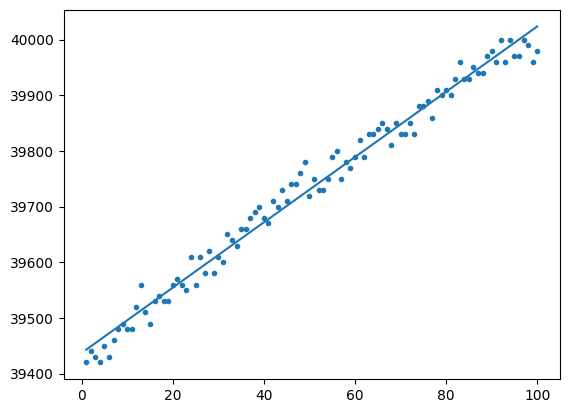

[5.86474649e+00 3.94372303e+04]


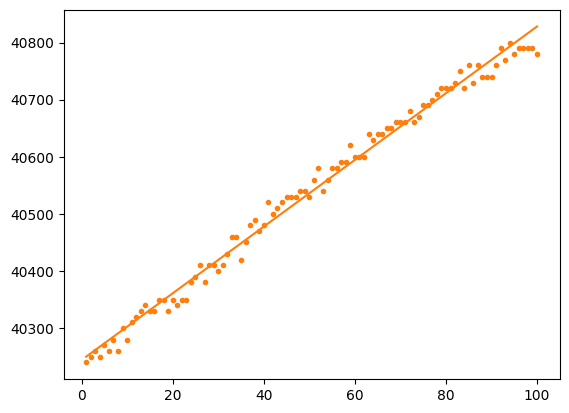

[5.83732376e+00 4.02443152e+04]


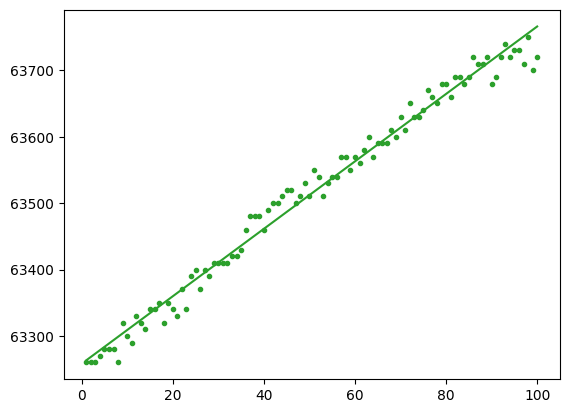

[5.07770792e+00 6.32581758e+04]


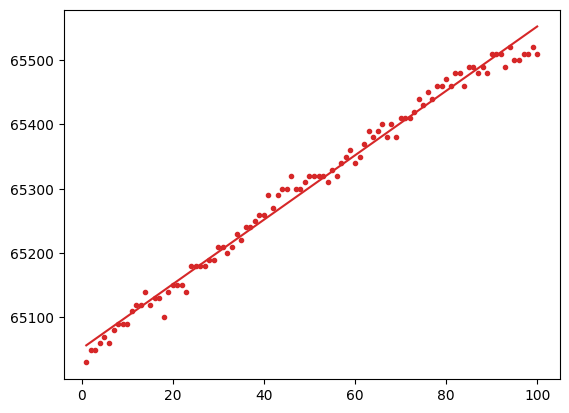

[5.00768083e+00 6.50516121e+04]


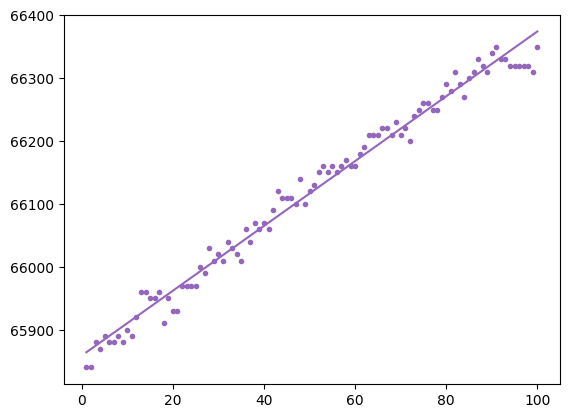

[5.15103503e+00 6.58590727e+04]


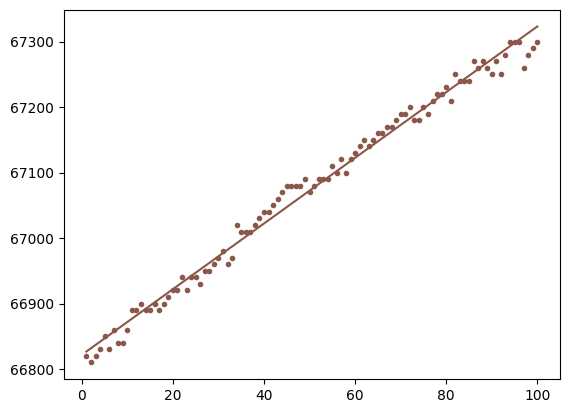

[5.01344121e+00 6.68217212e+04]


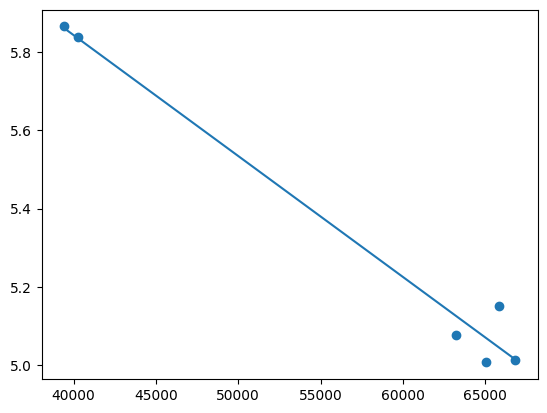

In [21]:
def line(x,m,c):
    return m*x+c

ms=[]
cs=[]

for i in range(6):
    plt.scatter(np.arange(1,101),offset[:,i],marker='.',color=f'C{i}')
    popt,pcov=curve_fit(
        f=line,
        xdata=np.arange(1,101),
        ydata=offset[:,i]
    )
    plt.plot(np.arange(1,101),line(np.arange(1,101),*popt),color=f'C{i}')
    plt.show()
    print(popt)
    ms.append(popt[0])
    cs.append(popt[1])

plt.scatter(cs,ms)
popt,pcov=curve_fit(
        f=line,
        xdata=cs,
        ydata=ms
    )
plt.plot(cs,line(np.array(cs),*popt))
plt.show()

def shiftt(t,i,popt=popt):
    return t-line(t,*popt)*i



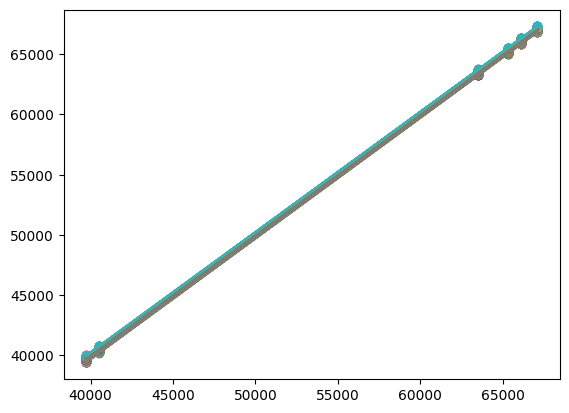

[np.float64(1.001574549892676), np.float64(1.0010584497676507), np.float64(1.0016030868816077), np.float64(1.0021752673884519), np.float64(1.001804949679798), np.float64(1.0019639266950255), np.float64(1.001520489018056), np.float64(1.001320853796863), np.float64(1.000701101269386), np.float64(1.0015748793091939), np.float64(1.001361407811212), np.float64(1.001079077953939), np.float64(1.0005483181655164), np.float64(1.0013583738347223), np.float64(1.001877965794666), np.float64(1.001288788874565), np.float64(1.000770729569366), np.float64(1.0000519186574335), np.float64(1.0015748793091939), np.float64(1.000519738191155), np.float64(1.000435675625389), np.float64(1.0013952134274704), np.float64(1.0010438507844615), np.float64(1.00025793232864), np.float64(1.0011425123334166), np.float64(0.9997346475358785), np.float64(1.0012586831554544), np.float64(1.0003258268186241), np.float64(1.0011820349051417), np.float64(1.0011840981225109), np.float64(1.001204457572489), np.float64(0.999809501

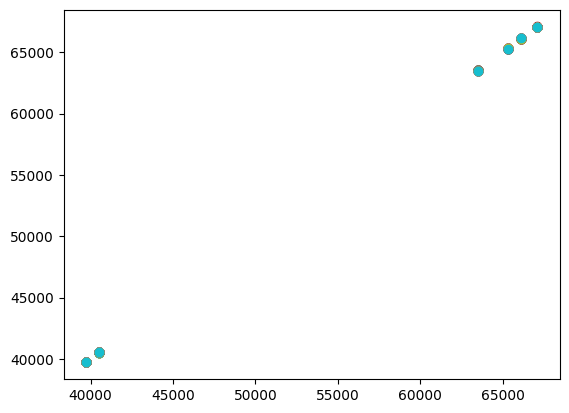

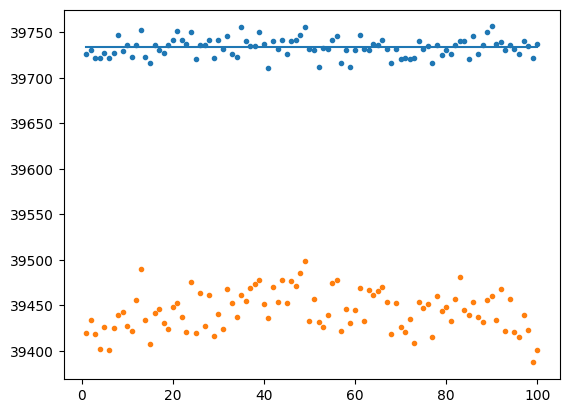

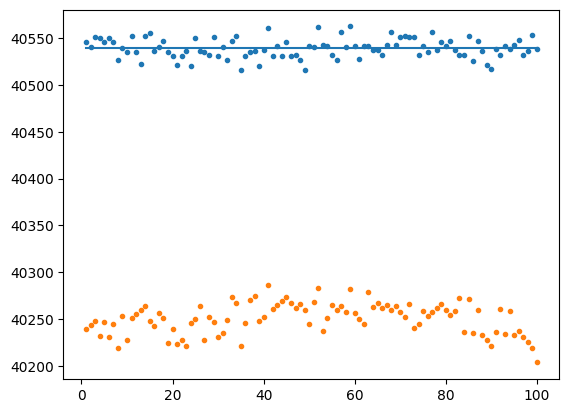

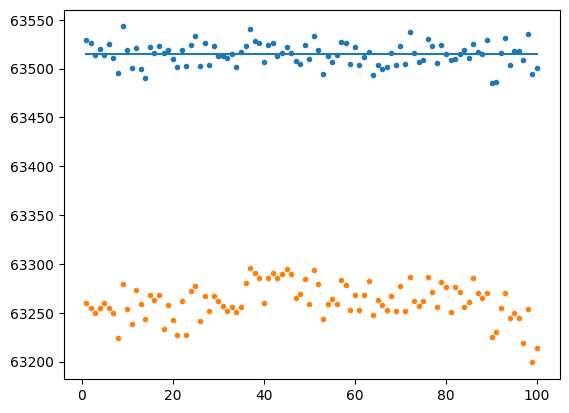

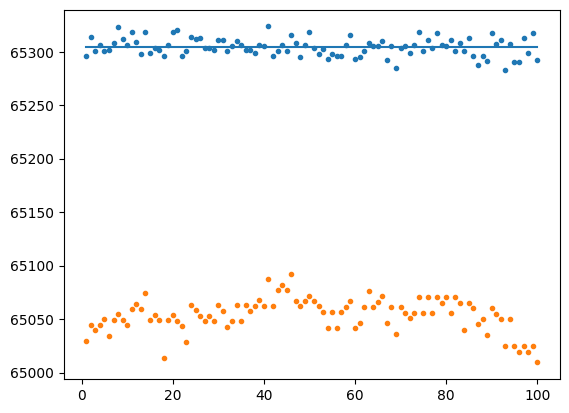

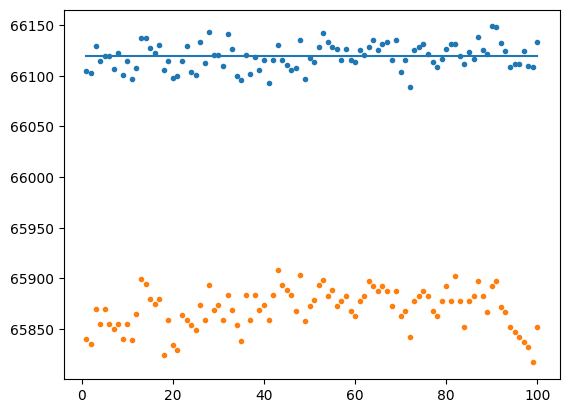

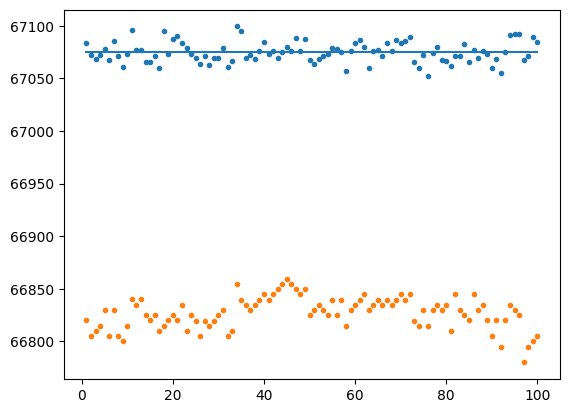

In [22]:
zero=np.mean(offset,axis=0)

ms=[]
cs=[]

for i in range(100):
    plt.scatter(zero,offset[i])
    popt,pcov=curve_fit(
        f=line,
        xdata=zero,
        ydata=offset[i]
    )
    ms.append(popt[0])
    cs.append(popt[1])
    plt.plot(zero,line(zero,*popt))

plt.show()

print(ms,cs)

def shift(t,i,ms=np.array(ms),cs=np.array(cs)):
    return (t-cs[i])/ms[i]

for i in range(100):
    plt.scatter(zero,shift(offset[i],i))

plt.show()

for i in range(6):
    plt.scatter(np.arange(1,101),shift(offset[:,i],np.arange(0,100)),marker='.')
    plt.scatter(np.arange(1,101),shiftt(offset[:,i],np.arange(0,100)),marker='.')
    #plt.scatter(np.arange(1,101),offset[:,i],marker='.',color=f'C{i}')
    plt.plot([1,100],[zero[i],zero[i]])
    plt.show()

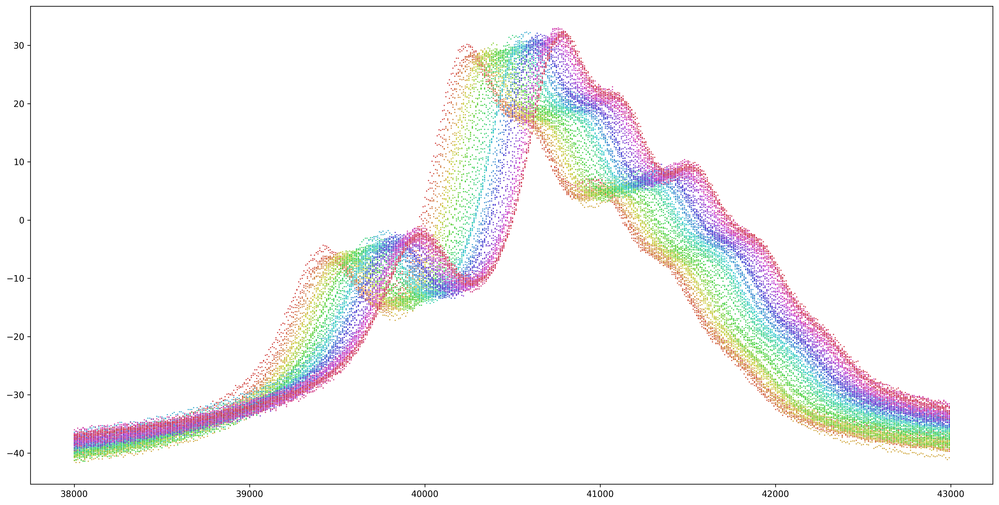

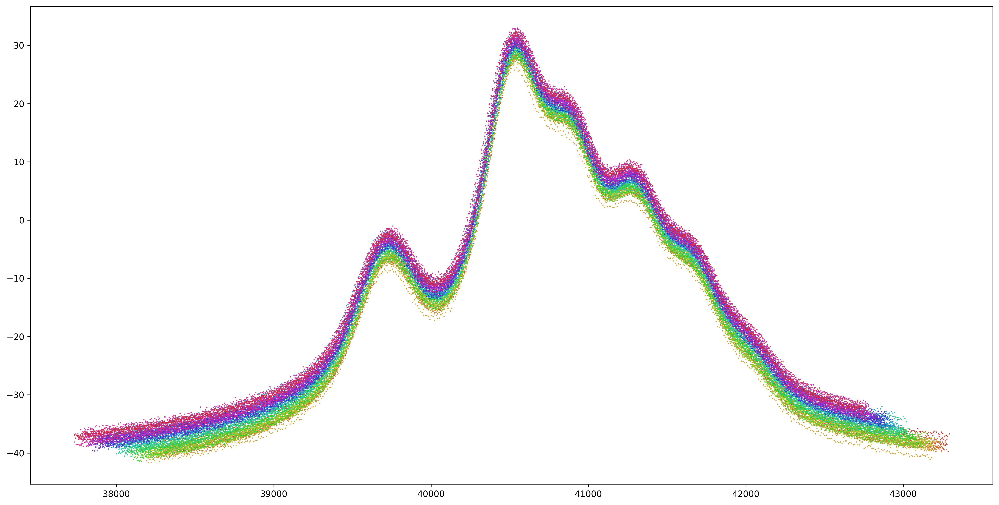

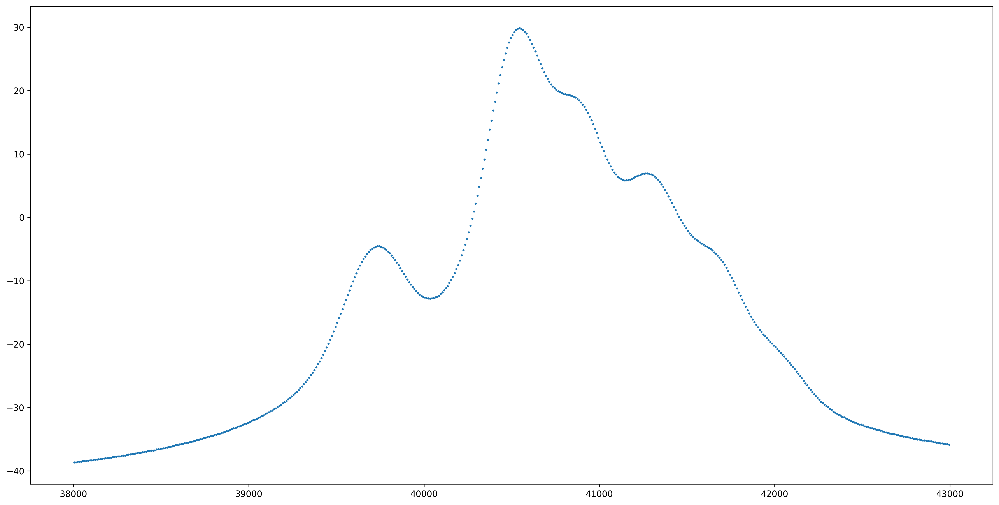

In [23]:
plt.figure(figsize=(20,10),dpi=300)
for i in range(100):
    spec=unp.nominal_values(grouped_data[i,3800:4300])
    col=hsv_to_rgb((i/100,0.8,0.8))
    plt.scatter((np.arange(3800,4300)*D_GROUP_SIZE),spec,s=0.2,color=col)

plt.show()


plt.figure(figsize=(20,10),dpi=300)
for i in range(100):
    spec=unp.nominal_values(grouped_data[i,3800:4300])
    col=hsv_to_rgb((i/100,0.8,0.8))
    plt.scatter(shift(np.arange(3800,4300)*D_GROUP_SIZE,i),spec,s=0.2,color=col)

plt.show()

ts=[]
vs=[]
for i in range(N_RUNS):
    vs+=list(unp.nominal_values(data[i]))
    ts+=list(shift(np.arange(0,N_POINTS),i))

ts=np.array(ts)
vs=np.array(vs)

order=np.argsort(ts)

ts=ts[order]
vs=vs[order]

ts=ts[3800000:4300000]
vs=vs[3800000:4300000]

bin_width=np.abs((ts[0]-ts[-1])/500)
start=ts[0]

gts=[[]]
gvs=[[]]

for i,t in enumerate(ts):
    if t<start+bin_width:
        gts[-1].append(t)
        gvs[-1].append(vs[i])
    else:
        start+=bin_width
        gts.append([t])
        gvs.append([vs[i]])

mts=[]
mvs=[]
for i,st in enumerate(gts):
    mts.append(np.mean(st))
    mvs.append(np.mean(gvs[i]))

plt.figure(figsize=(20,10),dpi=300)
plt.scatter(mts,mvs,s=2)

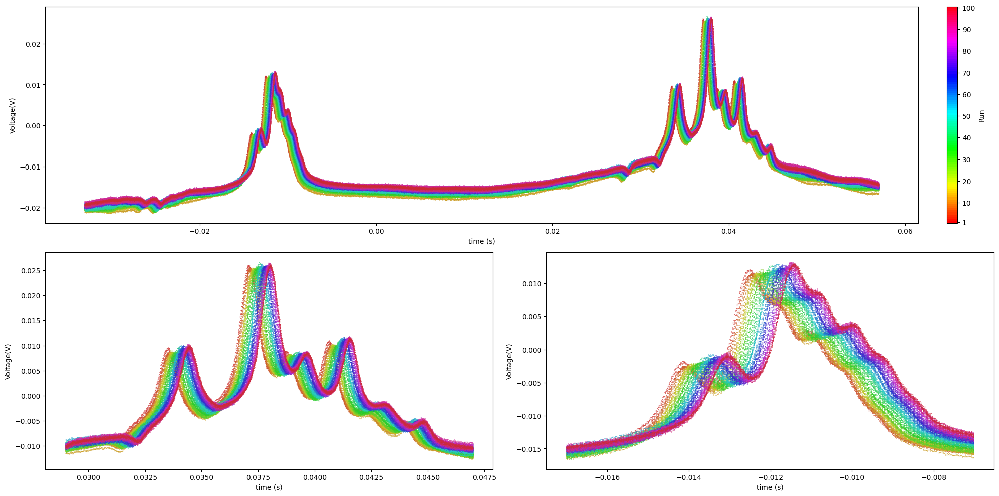

In [24]:
def scale_time(t):
    return 2*10**(-6)*t+-93*10**(-3)

def scale_voltage(v):
    return 400*10**(-6)*v

#layout
fig, axs = plt.subplots(2,2,figsize=(20,10))
gs = axs[1, 1].get_gridspec()
for ax in axs[0, :]:
    ax.remove()
axbig = fig.add_subplot(gs[0, :])

#add the colour bar
fig.colorbar(cm.ScalarMappable(cmap='hsv'),ax=axbig,label="Run",ticks=[1,10,20,30,40,50,60,70,80,90,100],boundaries=np.linspace(0.5,100.5,101),values=np.linspace(0,0.99,100),fraction=0.05,pad=0.03)

#the full spectrum
for i in range(100):
    spec=scale_voltage(unp.nominal_values(grouped_data[i,3000:7500]))
    col=hsv_to_rgb((i/100,0.8,0.8))
    axbig.scatter(scale_time(np.arange(3000,7500)*D_GROUP_SIZE),spec,s=0.2,color=col)

for i in range(100):
    spec=scale_voltage(unp.nominal_values(grouped_data[i,6100:7000]))
    col=hsv_to_rgb((i/100,0.8,0.8))
    axs[1,0].scatter(scale_time(np.arange(6100,7000)*D_GROUP_SIZE),spec,s=0.2,color=col)

for i in range(100):
    spec=scale_voltage(unp.nominal_values(grouped_data[i,3800:4300]))
    col=hsv_to_rgb((i/100,0.8,0.8))
    axs[1,1].scatter(scale_time(np.arange(3800,4300)*D_GROUP_SIZE),spec,s=0.2,color=col)

axbig.set_xlabel("time (s)")
axs[1,0].set_xlabel("time (s)")
axs[1,1].set_xlabel("time (s)")
axbig.set_ylabel("Voltage(V)")
axs[1,0].set_ylabel("Voltage(V)")
axs[1,1].set_ylabel("Voltage(V)")

fig.tight_layout()

fig.savefig("all_doppler_free.png",dpi=300)


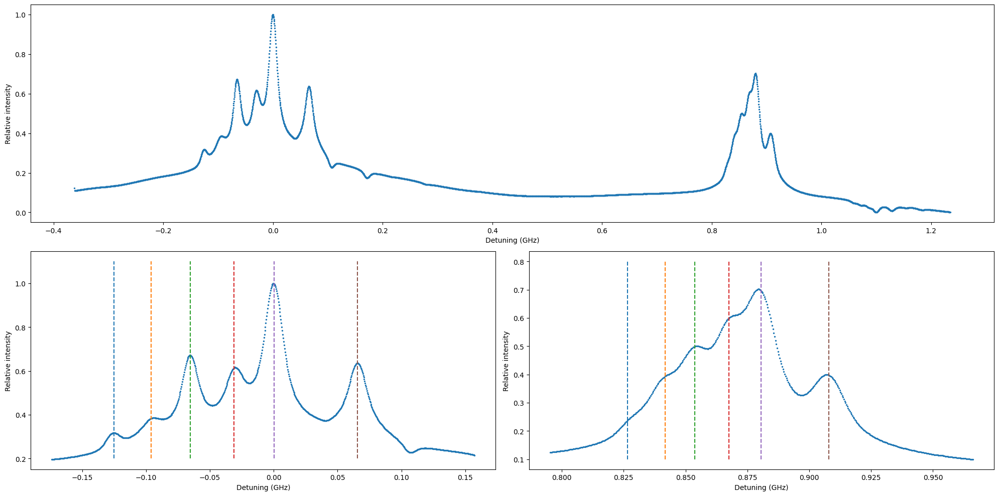

In [56]:
#layout
fig, axs = plt.subplots(2,2,figsize=(20,10))
gs = axs[1, 1].get_gridspec()
for ax in axs[0, :]:
    ax.remove()
axbig = fig.add_subplot(gs[0, :])


for i in range(100):
    spec=unp.nominal_values(grouped_data[i,3000:7500])
    col=hsv_to_rgb((i/100,0.8,0.8))
    peaks,properties=find_peaks(spec,prominence=1)
    peak_order=np.argsort(properties["prominences"])
    offset[i]=peaks[peak_order[-1]]





ts=[]
vs=[]
for i in range(N_RUNS):
    vs+=list(unp.nominal_values(data[i]))
    ts+=list(shift(np.arange(0,N_POINTS),i))

ts=np.array(ts)
vs=np.array(vs)

order=np.argsort(ts)

ts=ts[order]
vs=vs[order]

ts=ts[3000000:7500000]
vs=vs[3000000:7500000]

bin_width=np.abs((ts[0]-ts[-1])/4500)
start=ts[0]

gts=[[]]
gvs=[[]]

for i,t in enumerate(ts):
    if t<start+bin_width:
        gts[-1].append(t)
        gvs[-1].append(vs[i])
    else:
        start+=bin_width
        gts.append([t])
        gvs.append([vs[i]])

t=[]
v=[]
for i,st in enumerate(gts):
    t.append(np.mean(st))
    v.append(np.mean(gvs[i]))

t=md(np.array(t)-zero[3])
v=(v-np.min(v))
v=v/np.max(v)

#plot big one
axbig.scatter(t,v,s=2)

#fitting stuff
def lorenz(x,A,x0,gamma):
    return A/((1+((x-x0)/gamma)**2))

def fit(x,*p):
    y=0
    for i in range(6):
        y+=lorenz(x,p[3*i+0],p[3*i+1],p[3*i+2])
    y+=p[18]
    return y


f=[]

p0=[0.1, 0.8250, 0.01,
    0.25, 0.84135552, 0.01364581,
    0.2, 0.85359433, 0.00662299,
    0.35, 0.8676879,  0.0093215,
    0.53, 0.88055458, 0.00800642,
    0.32, 0.9080054,  0.00888442,
    0.1]

popt,pcov=curve_fit(
    f=fit,
    xdata=t[800:1300],
    ydata=v[800:1300],
    p0=p0,
    maxfev=10**8
)

As=list(popt[0:18:3])
fs=list(popt[1:18:3])
gammas=list(popt[2:18:3])

for i in range(6):
    f.append(popt[3*i+1])
    axs[1,1].plot([f[-1],f[-1]],[0.1,0.8],linestyle='--')

p0=[0.1, -0.13, 0.01,
    0.25, -0.09, 0.01364581,
    0.2, -0.065, 0.00662299,
    0.35, -0.035,  0.0093215,
    0.53, 0, 0.00800642,
    0.32, 0.07,  0.00888442,
    0.1]

popt,pcov=curve_fit(
    f=fit,
    xdata=t[3100:4000],
    ydata=v[3100:4000],
    p0=p0,
    maxfev=10**8
)

As+=list(popt[0:18:3])
fs+=list(popt[1:18:3])
gammas+=list(popt[2:18:3])

for i in range(6):
    f.append(popt[3*i+1])
    axs[1,0].plot([f[-1],f[-1]],[0.2,1.1],linestyle='--')


axs[1,0].scatter(t[3100:4000],v[3100:4000],s=2)

#axs[1,1].plot(t[800:1300],fit(t[800:1300],*popt),color='C1')
axs[1,1].scatter(t[800:1300],v[800:1300],s=2)



axbig.set_xlabel("Detuning (GHz)")
axs[1,0].set_xlabel("Detuning (GHz)")
axs[1,1].set_xlabel("Detuning (GHz)")
axbig.set_ylabel("Relative intensity")
axs[1,0].set_ylabel("Relative intensity")
axs[1,1].set_ylabel("Relative intensity")

fig.tight_layout()

fig.savefig("combined_doppler_free.png",dpi=300)

#still need to calibrate axis and align based of all peaks not just one

In [57]:
print(As)
print(fs)
print(gammas)

[np.float64(0.017105912797321883), np.float64(0.20539832498799332), np.float64(0.14820858504069281), np.float64(0.2967071003433781), np.float64(0.44421289304778266), np.float64(0.24227988570583603), np.float64(0.07915596706984618), np.float64(0.12152727710027496), np.float64(0.3970033248839217), np.float64(0.285574112182443), np.float64(0.7228878658420296), np.float64(0.38170123343857887)]
[np.float64(0.8265290414451947), np.float64(0.8418653246319899), np.float64(0.8536709852109263), np.float64(0.8676122124146685), np.float64(0.880602689785581), np.float64(0.9080132919012613), np.float64(-0.12527310591278373), np.float64(-0.09609932753287848), np.float64(-0.06538543900033993), np.float64(-0.031190190898900204), np.float64(0.00021575416179196955), np.float64(0.06540270403776927)]
[np.float64(0.00311384111898779), np.float64(0.013899838274900973), np.float64(0.006296813464980997), np.float64(0.009673694099746848), np.float64(0.008154580205864449), np.float64(0.009727286680894504), np.fl

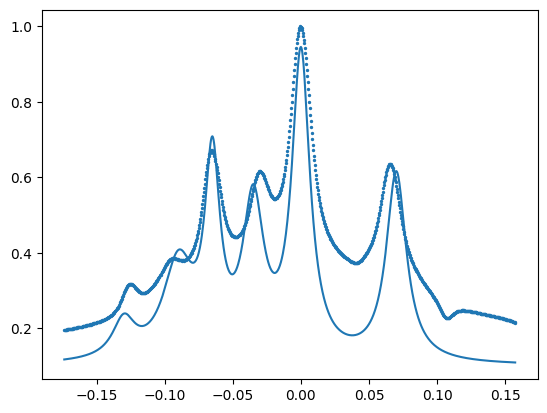

In [32]:
def lorenz(x,A,x0,gamma):
    return A/((1+((x-x0)/gamma)**2))

def fit(x,*p):
    y=0
    for i in range(6):
        y+=lorenz(x,p[3*i+0],p[3*i+1],p[3*i+2])
    y+=p[18]
    return y

p0=[0.1, -0.13, 0.01,
    0.25, -0.09, 0.01364581,
    0.5, -0.065, 0.00662299,
    0.4, -0.035,  0.0093215,
    0.8, 0, 0.00800642,
    0.5, 0.07,  0.00888442,
    0.1]

plt.scatter(t[3100:4000],v[3100:4000],s=2)
plt.plot(t[3100:4000],fit(t[3100:4000],*p0))

plt.show()

[ 0.07915871 -0.12527302  0.00573084]
[ 0.1215266  -0.09609934  0.01248287]
[ 0.39700179 -0.0653854   0.00962371]
[ 0.28557394 -0.0311902   0.01079938]
[7.22887514e-01 2.15755389e-04 1.12832044e-02]
[0.38170095 0.0654027  0.01394178]
[0.20428813]
[]


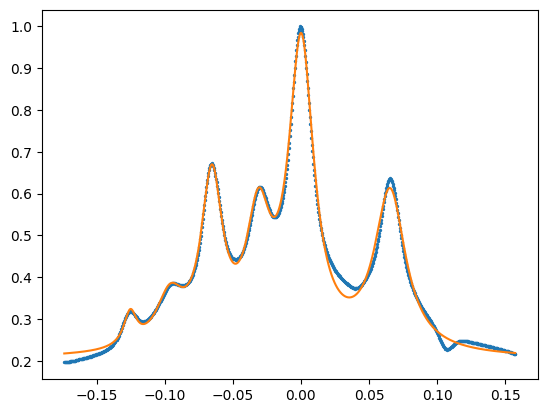

In [35]:

popt,pcov=curve_fit(
    f=fit,
    xdata=t[3100:4000],
    ydata=v[3100:4000],
    p0=p0,
    maxfev=10**8
)

plt.scatter(t[3100:4000],v[3100:4000],s=2)
plt.plot(t[3100:4000],fit(t[3100:4000],*popt),color='C1')

for i in range(6):
    print(popt[3*i:3*i+3])
    f=popt[3*i+1]
    #plt.plot([f,f],[0,1])
print(popt[18:20])
print(popt[20:23])

plt.show()

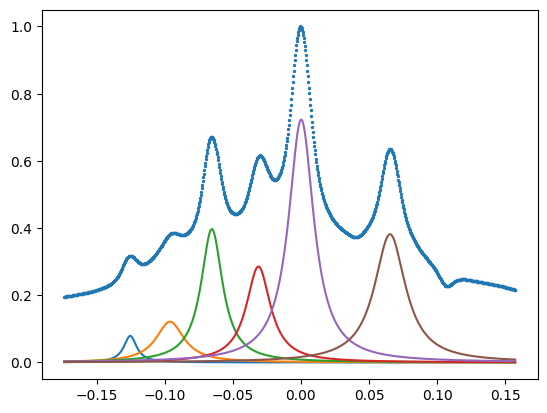

In [36]:
plt.scatter(t[3100:4000],v[3100:4000],s=2)
for i in range(6):
    plt.plot(t[3100:4000],lorenz(t[3100:4000],*popt[3*i:3*i+3]))

In [44]:
As=popt[0:18:3]
fs=popt[1:18:3]
gammas=popt[2:18:3]
c=popt[18]

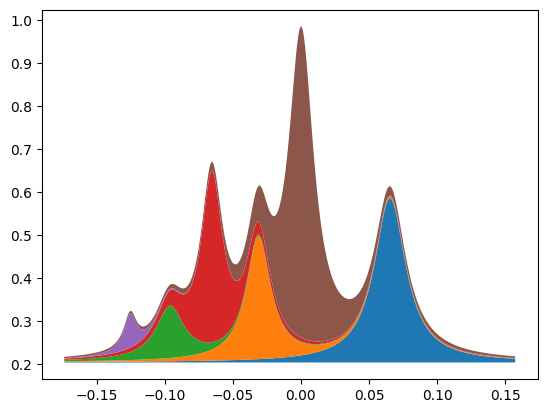

In [55]:
order=np.argsort(As)


#plt.scatter(t[3100:4000],v[3100:4000],s=2)

floor=np.full((900),c)

for i in [5,3,1,2,0,4]:
    plt.fill_between(t[3100:4000],lorenz(t[3100:4000],As[i],fs[i],gammas[i])+floor,floor)
    floor+=lorenz(t[3100:4000],As[i],fs[i],gammas[i])